In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import random

random.seed(10)


def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]
    

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)

In [2]:
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'csv.csv' #CA the name does not matter here other than .csv extention, we will read and combine data in the cell below
X = 'X:X'
Y = 'Y:Y'
reg = 'File Name'
file_type = 'csv'

cluster_col = 'ClusterName'
keep_cols = [X,Y,reg,cluster_col]
save_path = ''

In [3]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    #CA read data to be combined
    cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
    cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
    cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    
    #CA combine all data read with the next to line
cells_3groups = [cells1, cells2, cells3]
cells_all = pd.concat(cells_3groups)

cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values
list(cells['patients'].unique())

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/1383547729.py:18: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


[12, 11, 10, 13, 9, 7, 8, 6, 5, 4, 3, 2, 1]

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:20: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3545958995819092 0.3552870750427246
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06242513656616211 0.4370880126953125
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12883806228637695 0.571284294128418
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34255528450012207 0.9169042110443115
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23749613761901855 1.1611998081207275
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24280428886413574 1.411001205444336
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2416858673095703 1.6582138538360596
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4991488456726074 2.163311719894409
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017184019088745117 2.1925480365753174
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05274486541748047 2.250380039215088
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30289316177368164 2.5545501708984375
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37110304832458496 0.3717470169067383
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06252002716064453 0.45332980155944824
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12776494026184082 0.5854408740997314
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32296180725097656 0.9110240936279297
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24199700355529785 1.1604790687561035
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24406194686889648 1.4111931324005127
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2426159381866455 1.65948486328125
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48921799659729004 2.1546528339385986
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017382144927978516 2.184216022491455
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05154895782470703 2.24048113822937
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29974985122680664 2.5413460731506348
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37265610694885254 0.37331604957580566
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061283111572265625 0.44649219512939453
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12505006790161133 0.5756587982177734
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3247530460357666 0.902785062789917
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23716998100280762 1.1459739208221436
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24319219589233398 1.3955321311950684
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23982715606689453 1.6401550769805908
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4905052185058594 2.136348247528076
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01748204231262207 2.165437936782837
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05137181282043457 2.2215869426727295
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29927825927734375 2.521956205368042
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38413429260253906 0.38480210304260254
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06509613990783691 0.464205265045166
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12917613983154297 0.5979609489440918
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3352341651916504 0.9359052181243896
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24256396293640137 1.1851458549499512
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24713587760925293 1.4390759468078613
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2552640438079834 1.6996753215789795
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5137979984283447 2.21976900100708
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018716096878051758 2.2513670921325684
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0541379451751709 2.310343027114868
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3121521472930908 2.623751163482666
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38463306427001953 0.38533926010131836
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0649569034576416 0.4633517265319824
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13144183158874512 0.5993490219116211
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33704614639282227 0.9391689300537109
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24665403366088867 1.1926820278167725
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2592790126800537 1.458827018737793
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24879002571105957 1.7133808135986328
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5048162937164307 2.224147081375122
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01874685287475586 2.2547848224639893
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054368019104003906 2.3139700889587402
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3132619857788086 2.6284730434417725
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37746405601501465 0.3781890869140625
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06193423271179199 0.452045202255249
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12579107284545898 0.5818700790405273
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3249359130859375 0.9094946384429932
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23410511016845703 1.1498448848724365
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2443993091583252 1.4008901119232178
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24399113655090332 1.6499922275543213
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4979391098022461 2.153710126876831
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017203807830810547 2.1825127601623535
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05280494689941406 2.239935874938965
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30394721031188965 2.5450692176818848
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38397884368896484 0.3846750259399414
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06621789932250977 0.4630310535430908
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1276249885559082 0.5948119163513184
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33817291259765625 0.93576979637146
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23676490783691406 1.1787478923797607
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24038076400756836 1.425765037536621
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24451708793640137 1.6754469871520996
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5011458396911621 2.1823220252990723
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017379283905029297 2.2115111351013184
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05264878273010254 2.26872181892395
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3080887794494629 2.577972888946533
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4001758098602295 0.4008300304412842
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06259799003601074 0.4761679172515869
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1303119659423828 0.6115891933441162
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3343851566314697 0.9489693641662598
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2338089942932129 1.1896870136260986
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24516034126281738 1.4416513442993164
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24743103981018066 1.694061040878296
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4972200393676758 2.197087287902832
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017349720001220703 2.226458787918091
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05386090278625488 2.2855489253997803
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30802369117736816 2.594850778579712
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38399696350097656 0.38465309143066406
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061971187591552734 0.4582672119140625
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12956690788269043 0.5916941165924072
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3275880813598633 0.9219410419464111
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23581695556640625 1.1642138957977295
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24056601524353027 1.4116699695587158
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24542593955993652 1.662146806716919
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5004818439483643 2.1683878898620605
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017870187759399414 2.197854995727539
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05210304260253906 2.2558579444885254
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3101978302001953 2.5672860145568848
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3694159984588623 0.3700737953186035
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06148219108581543 0.4438300132751465
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12587714195251465 0.5737800598144531
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33725476264953613 0.9137508869171143
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23353099822998047 1.1536781787872314
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24338793754577637 1.4038951396942139
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2503960132598877 1.6642990112304688
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5103969573974609 2.180337905883789
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017878055572509766 2.209773063659668
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0523378849029541 2.2672860622406006
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3024880886077881 2.571033239364624
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37235522270202637 0.37301206588745117
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06193685531616211 0.4483320713043213
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13689589500427246 0.5893340110778809
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3258860111236572 0.9181299209594727
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24640583992004395 1.1711859703063965
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23754119873046875 1.415252923965454
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24070215225219727 1.661012887954712
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49520301818847656 2.1620490550994873
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017334938049316406 2.19107985496521
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054036855697631836 2.2497050762176514
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31066012382507324 2.561722755432129
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3738710880279541 0.3746449947357178
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06206798553466797 0.44738101959228516
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1264359951019287 0.5778908729553223
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32627415657043457 0.9068291187286377
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23715591430664062 1.1503751277923584
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2528398036956787 1.4099509716033936
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24509167671203613 1.6601738929748535
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4917778968811035 2.1577308177948
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017516136169433594 2.1868152618408203
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05363011360168457 2.2450602054595947
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3011629581451416 2.5474228858947754
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3722701072692871 0.3729691505432129
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06241202354431152 0.44741320610046387
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12837481498718262 0.5797338485717773
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32621192932128906 0.9086418151855469
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23398613929748535 1.148622751235962
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24139118194580078 1.3965959548950195
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24060988426208496 1.6418519020080566
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4894421100616455 2.1367642879486084
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017464160919189453 2.165247917175293
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05124473571777344 2.221040725708008
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30075597763061523 2.5229530334472656
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.382282018661499 0.38297200202941895
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06387782096862793 0.4587388038635254
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13073492050170898 0.5935900211334229
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33257126808166504 0.9285252094268799
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23612499237060547 1.1712069511413574
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24143314361572266 1.4188992977142334
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2461402416229248 1.6698932647705078
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5035028457641602 2.1790049076080322
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01696300506591797 2.2072319984436035
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05280303955078125 2.2647838592529297
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30735206604003906 2.5733091831207275
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3713850975036621 0.37204504013061523
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06241321563720703 0.4469718933105469
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1266617774963379 0.578312873840332
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3256411552429199 0.9073541164398193
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24506616592407227 1.1592252254486084
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24015212059020996 1.4059991836547852
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24279284477233887 1.653857946395874
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4881770610809326 2.147761821746826
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017405033111572266 2.177340030670166
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052462100982666016 2.234644889831543
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30379390716552734 2.5399858951568604
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3784911632537842 0.3792870044708252
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06574797630310059 0.46516990661621094
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12720084190368652 0.5964407920837402
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3268160820007324 0.9259018898010254
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23470282554626465 1.1673641204833984
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24047088623046875 1.414679765701294
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24303507804870605 1.6629517078399658
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48976588249206543 2.1588199138641357
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01744699478149414 2.1882030963897705
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.053961992263793945 2.2466399669647217
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3086073398590088 2.5564842224121094
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37499499320983887 0.37564969062805176
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06280779838562012 0.4511716365814209
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12745308876037598 0.5831868648529053
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3263530731201172 0.9126811027526855
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23489999771118164 1.1544129848480225
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24024009704589844 1.4013960361480713
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24006986618041992 1.6465508937835693
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49506497383117676 2.147498846054077
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018009185791015625 2.179003953933716
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05391216278076172 2.2378721237182617
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29957127571105957 2.5387210845947266
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3722238540649414 0.37287092208862305
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06104707717895508 0.446364164352417
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13031673431396484 0.5806348323822021
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33345603942871094 0.9166297912597656
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23539185523986816 1.1582248210906982
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24315190315246582 1.4080719947814941
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2432551383972168 1.6563951969146729
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5018701553344727 2.163861036300659
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01767706871032715 2.1928961277008057
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0522150993347168 2.2496960163116455
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3031198978424072 2.554080009460449
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3766789436340332 0.37732577323913574
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06356406211853027 0.4520599842071533
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12744927406311035 0.5837512016296387
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32481884956359863 0.911895751953125
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23463201522827148 1.1530048847198486
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25194787979125977 1.41162109375
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2432410717010498 1.6599822044372559
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48804616928100586 2.1538708209991455
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01811385154724121 2.1835548877716064
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05619621276855469 2.244828939437866
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3030269145965576 2.5491480827331543
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37808918952941895 0.37874293327331543
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06123709678649902 0.45105600357055664
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12888216972351074 0.5840320587158203
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32427096366882324 0.911160945892334
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23366475105285645 1.150923728942871
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2438969612121582 1.4017579555511475
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23973512649536133 1.6467158794403076
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4903690814971924 2.1429061889648438
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017278194427490234 2.1716690063476562
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05239510536193848 2.2284440994262695
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29920196533203125 2.528809070587158
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3806440830230713 0.3813350200653076
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06441617012023926 0.4571802616119385
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1319870948791504 0.5933358669281006
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32422518730163574 0.9202902317047119
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23420333862304688 1.160677194595337
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24067425727844238 1.4079351425170898
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24524998664855957 1.658177137374878
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.501183271408081 2.1653101444244385
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018426895141601562 2.1970129013061523
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.057424068450927734 2.25970196723938
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3336360454559326 2.594972848892212
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37337708473205566 0.3740348815917969
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06181192398071289 0.4474036693572998
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13702082633972168 0.5884580612182617
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32981085777282715 0.920900821685791
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23821496963500977 1.1656157970428467
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24468040466308594 1.4168641567230225
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2447669506072998 1.6665019989013672
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48938512802124023 2.1614460945129395
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01732182502746582 2.1898460388183594
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05147814750671387 2.245840072631836
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.303663969039917 2.550658941268921
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.39080810546875 0.3923759460449219
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06404709815979004 0.46717000007629395
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12643098831176758 0.5975959300994873
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3246028423309326 0.9248838424682617
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23599004745483398 1.1669561862945557
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24134516716003418 1.414959192276001
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24023914337158203 1.6592121124267578
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4944038391113281 2.1601200103759766
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017081022262573242 2.1884379386901855
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054826974868774414 2.2478017807006836
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30857205390930176 2.5575218200683594
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37543606758117676 0.37609314918518066
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06329178810119629 0.45154500007629395
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12629985809326172 0.5817060470581055
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3261449337005615 0.910761833190918
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2331709861755371 1.1500880718231201
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24665498733520508 1.4033329486846924
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2409982681274414 1.6491150856018066
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4922211170196533 2.146865129470825
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017731904983520508 2.176774024963379
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05159807205200195 2.2329840660095215
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3014557361602783 2.5355730056762695
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36823511123657227 0.3689239025115967
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06123995780944824 0.44127988815307617
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1255481243133545 0.5705809593200684
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32507991790771484 0.898535966873169
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23355698585510254 1.1381359100341797
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24806904792785645 1.392848014831543
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25020384788513184 1.6478490829467773
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5090382099151611 2.16251802444458
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018024921417236328 2.191920042037964
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0551760196685791 2.2519707679748535
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3133718967437744 2.566558837890625
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.371474027633667 0.3721630573272705
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06121706962585449 0.4448819160461426
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13339591026306152 0.582420825958252
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32560276985168457 0.9108140468597412
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2441861629486084 1.1612699031829834
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2387678623199463 1.4064950942993164
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.268082857131958 1.6808929443359375
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.507512092590332 2.1942639350891113
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01820230484008789 2.2235310077667236
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05347084999084473 2.281651258468628
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.311539888381958 2.594454050064087
Starting: 9/13 : 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.39158010482788086 0.39224886894226074
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06704902648925781 0.47081589698791504
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13201165199279785 0.6070196628570557
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3344459533691406 0.9444899559020996
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24637699127197266 1.1973109245300293
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.31479501724243164 1.5187668800354004
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3188741207122803 1.8453829288482666
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5045561790466309 2.355620861053467
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01784825325012207 2.3850560188293457
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05669212341308594 2.4466159343719482
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31670498847961426 2.7646589279174805
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36786794662475586 0.3685331344604492
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06135106086730957 0.4413471221923828
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12819385528564453 0.5736539363861084
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32477688789367676 0.9012060165405273
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23632097244262695 1.14375901222229
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24339795112609863 1.3949861526489258
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24215292930603027 1.6420199871063232
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4952869415283203 2.1427459716796875
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.0169370174407959 2.1706371307373047
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051999807357788086 2.227146863937378
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3016211986541748 2.5299201011657715
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.368725061416626 0.36937403678894043
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061517953872680664 0.4427812099456787
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12607622146606445 0.5729231834411621
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32669496536254883 0.9021892547607422
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24355411529541016 1.1520960330963135
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24975299835205078 1.4084100723266602
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24258041381835938 1.6557502746582031
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49158596992492676 2.1529252529144287
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016993045806884766 2.18173885345459
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05284690856933594 2.2390849590301514
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30460500717163086 2.54486083984375
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3693273067474365 0.3699781894683838
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061578989028930664 0.4429759979248047
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1251819133758545 0.572105884552002
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.327380895614624 0.9020211696624756
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2444150447845459 1.153531789779663
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2462472915649414 1.4063591957092285
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24067902565002441 1.6518688201904297
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4976348876953125 2.1552019119262695
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01778721809387207 2.1845500469207764
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05195808410644531 2.241115093231201
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29997897148132324 2.5422539710998535
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38228487968444824 0.38295698165893555
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061224937438964844 0.45641088485717773
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14002585411071777 0.6004316806793213
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33776283264160156 0.9407918453216553
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23854994773864746 1.18569016456604
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2461528778076172 1.438567876815796
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24233007431030273 1.6858980655670166
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5073647499084473 2.1989409923553467
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01772284507751465 2.227987051010132
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0545039176940918 2.287320852279663
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3079359531402588 2.596547842025757
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3720729351043701 0.37273597717285156
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06089019775390625 0.4445061683654785
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13727068901062012 0.5854699611663818
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3267061710357666 0.9146003723144531
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23918843269348145 1.1599652767181396
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2405259609222412 1.4070789813995361
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24860501289367676 1.6606910228729248
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4980440139770508 2.164177894592285
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01782989501953125 2.1932029724121094
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05195283889770508 2.2500159740448
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3058202266693115 2.5569872856140137
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36531519889831543 0.36598992347717285
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06113004684448242 0.4396998882293701
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.129075288772583 0.5727431774139404
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3392758369445801 0.9147419929504395
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2346651554107666 1.1558570861816406
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2475268840789795 1.40997314453125
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24094796180725098 1.6556789875030518
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4898099899291992 2.1509430408477783
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017144203186035156 2.179013252258301
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05112028121948242 2.2346370220184326
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30260491371154785 2.5384018421173096
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3742341995239258 0.3748910427093506
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06083202362060547 0.44790101051330566
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12656593322753906 0.5786619186401367
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33196187019348145 0.913475751876831
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23138976097106934 1.151432991027832
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2383592128753662 1.396559238433838
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2434229850769043 1.644953727722168
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5072309970855713 2.157921075820923
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01705193519592285 2.186415910720825
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051113128662109375 2.242220878601074
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30270910263061523 2.5460939407348633
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.372974157333374 0.37367987632751465
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06876707077026367 0.45473790168762207
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12801194190979004 0.5879628658294678
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32731103897094727 0.9179320335388184
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23634886741638184 1.1607558727264404
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24131202697753906 1.4090969562530518
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24943208694458008 1.6635630130767822
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49402880668640137 2.16351580619812
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017027616500854492 2.192826747894287
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.055310964584350586 2.252941131591797
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31426000595092773 2.568451166152954
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3721339702606201 0.37279200553894043
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06366801261901855 0.4474828243255615
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13626599311828613 0.5877077579498291
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32828807830810547 0.918729305267334
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23295211791992188 1.157970905303955
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23967695236206055 1.4043598175048828
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2392101287841797 1.6485669612884521
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5035979747772217 2.1581718921661377
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018843889236450195 2.1894469261169434
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.057230234146118164 2.2514779567718506
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3319401741027832 2.5847079753875732
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4179348945617676 0.41862988471984863
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06335306167602539 0.4969782829284668
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13542985916137695 0.6372559070587158
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3294408321380615 0.9695217609405518
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25231385231018066 1.2283070087432861
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25006699562072754 1.4874908924102783
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2486860752105713 1.741518259048462
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5199170112609863 2.267638921737671
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017233848571777344 2.2976808547973633
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052247047424316406 2.3577399253845215
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3059241771697998 2.6650290489196777
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37222814559936523 0.37297606468200684
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061334848403930664 0.4460768699645996
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12613201141357422 0.5762941837310791
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3219161033630371 0.9007430076599121
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23249411582946777 1.139463186264038
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24418878555297852 1.3907349109649658
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24075865745544434 1.6363379955291748
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4891011714935303 2.131056070327759
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.0205080509185791 2.1630029678344727
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05415511131286621 2.223083019256592
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2988128662109375 2.523132801055908
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3776843547821045 0.3784162998199463
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0648953914642334 0.45508813858032227
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13434696197509766 0.5936558246612549
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32485413551330566 0.9211971759796143
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.29310107231140137 1.2206521034240723
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25516295433044434 1.4830400943756104
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25812292098999023 1.7481358051300049
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5637691020965576 2.3179311752319336
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.02032184600830078 2.351996898651123
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06082296371459961 2.4191789627075195
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33106493949890137 2.7515199184417725
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.374035120010376 0.3746919631958008
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06258893013000488 0.45093393325805664
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12768912315368652 0.5827882289886475
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3289611339569092 0.9144201278686523
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24522805213928223 1.1661372184753418
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25061678886413574 1.4232289791107178
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24205899238586426 1.6703388690948486
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4922010898590088 2.168523073196411
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017315149307250977 2.1973912715911865
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05145692825317383 2.2535831928253174
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30281591415405273 2.557569980621338
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37998104095458984 0.3806428909301758
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06222987174987793 0.45563483238220215
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12882208824157715 0.5893459320068359
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33120107650756836 0.9238448143005371
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2367417812347412 1.1676609516143799
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24439287185668945 1.418959140777588
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2461240291595459 1.6701931953430176
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4926009178161621 2.1694090366363525
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017008304595947266 2.1982553005218506
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052304744720458984 2.2555408477783203
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3001236915588379 2.556938886642456
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3829200267791748 0.3835620880126953
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.062426090240478516 0.4580881595611572
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13065004348754883 0.5936579704284668
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3308119773864746 0.9272620677947998
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.234421968460083 1.1685681343078613
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2412109375 1.416511058807373
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2474219799041748 1.6690170764923096
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48962879180908203 2.164557933807373
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016975879669189453 2.1938796043395996
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05186009407043457 2.2503910064697266
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3045361042022705 2.556239128112793
Starting: 9/13 : 5

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36968088150024414 0.3703298568725586
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06473922729492188 0.4476737976074219
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1314103603363037 0.5850334167480469
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32563304901123047 0.9138820171356201
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23392295837402344 1.1549367904663086
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25176119804382324 1.4133660793304443
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2413959503173828 1.6598138809204102
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4893050193786621 2.1548967361450195
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01758408546447754 2.1847238540649414
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05188298225402832 2.241511821746826
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30295300483703613 2.5457608699798584
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36984801292419434 0.37050533294677734
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06338787078857422 0.44625401496887207
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1323690414428711 0.5832149982452393
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3273801803588867 0.9132950305938721
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23476815223693848 1.1546151638031006
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25297093391418457 1.4142718315124512
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23777198791503906 1.6568708419799805
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4981040954589844 2.160565137863159
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017196178436279297 2.189321994781494
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051753997802734375 2.2456462383270264
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3067140579223633 2.5536041259765625
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3678462505340576 0.36850404739379883
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0605471134185791 0.4403541088104248
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1258699893951416 0.5708229541778564
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.324260950088501 0.8977930545806885
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2398841381072998 1.143941879272461
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2424619197845459 1.3925256729125977
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2392120361328125 1.6364519596099854
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4928147792816162 2.1349997520446777
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01704716682434082 2.1633129119873047
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05112791061401367 2.219552993774414
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2975759506225586 2.5185019969940186
Starting: 9/13 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37038588523864746 0.3710510730743408
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06124591827392578 0.44487810134887695
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12811708450317383 0.5777480602264404
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32587218284606934 0.9071910381317139
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24080324172973633 1.1548712253570557
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23969483375549316 1.401357889175415
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24143385887145996 1.6479387283325195
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48818421363830566 2.1420722007751465
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01685619354248047 2.1703951358795166
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05209803581237793 2.22770619392395
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3036940097808838 2.5326530933380127
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37349414825439453 0.3742411136627197
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06477475166320801 0.45078396797180176
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13049721717834473 0.5860123634338379
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3231940269470215 0.9123210906982422
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23363709449768066 1.1526029109954834
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24421000480651855 1.4035627841949463
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2415010929107666 1.650331974029541
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5017406940460205 2.157927989959717
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016969919204711914 2.186394214630127
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05187630653381348 2.2430243492126465
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.298565149307251 2.5430471897125244
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38266801834106445 0.3833491802215576
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06305289268493652 0.45777082443237305
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12598514556884766 0.5875189304351807
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3327212333679199 0.922497034072876
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24293088912963867 1.1714868545532227
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24541616439819336 1.4231982231140137
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24685001373291016 1.6748368740081787
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5214831829071045 2.2028329372406006
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01834392547607422 2.232675790786743
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054052114486694336 2.2914130687713623
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30869483947753906 2.601261854171753
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3803539276123047 0.38103604316711426
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06257271766662598 0.45551180839538574
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1311328411102295 0.5905599594116211
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33765220642089844 0.9307429790496826
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24301385879516602 1.1805126667022705
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2531147003173828 1.44051194190979
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2558610439300537 1.7019240856170654
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5143842697143555 2.222048044204712
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018105030059814453 2.2519779205322266
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05490279197692871 2.311736822128296
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3151988983154297 2.62825083732605
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37773585319519043 0.37839484214782715
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06478524208068848 0.4554591178894043
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12796688079833984 0.5875489711761475
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34082508087158203 0.930912971496582
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25092005729675293 1.189378023147583
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.26108288764953613 1.4571819305419922
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.26802802085876465 1.7303051948547363
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.548947811126709 2.2857508659362793
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018017053604125977 2.3169500827789307
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05421805381774902 2.3771519660949707
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3534362316131592 2.7318902015686035
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3790557384490967 0.37972402572631836
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061432838439941406 0.45200014114379883
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12718796730041504 0.5831248760223389
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32784008979797363 0.9134650230407715
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23762297630310059 1.1576979160308838
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2398080825805664 1.4039192199707031
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25365614891052246 1.6627461910247803
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5039231777191162 2.172391176223755
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01747870445251465 2.2027838230133057
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052667856216430664 2.260075092315674
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3030707836151123 2.5643727779388428
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36904191970825195 0.36972475051879883
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06289386749267578 0.44396471977233887
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13065385818481445 0.5788278579711914
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33707189559936523 0.9184799194335938
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23929595947265625 1.1640639305114746
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24570512771606445 1.416276216506958
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24179601669311523 1.6628620624542236
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48895812034606934 2.157210111618042
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017385005950927734 2.185670852661133
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05513477325439453 2.2452967166900635
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3034980297088623 2.550020933151245
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37117886543273926 0.37186503410339355
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06306791305541992 0.44800305366516113
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1344919204711914 0.5866308212280273
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3259899616241455 0.9150798320770264
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25185370445251465 1.1731529235839844
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25083231925964355 1.4302983283996582
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24107694625854492 1.676070213317871
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5028328895568848 2.1858038902282715
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017182111740112305 2.214114189147949
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05233407020568848 2.2710609436035156
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30866503715515137 2.58097505569458
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37637925148010254 0.377042293548584
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06239891052246094 0.4515960216522217
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12948203086853027 0.5855419635772705
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3301372528076172 0.9184410572052002
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23432183265686035 1.1594388484954834
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23877406120300293 1.4046299457550049
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23826193809509277 1.647784948348999
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48446202278137207 2.139008045196533
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017115116119384766 2.1683309078216553
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05205082893371582 2.225496768951416
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.300875186920166 2.5276100635528564
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3724548816680908 0.3731107711791992
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061228036880493164 0.44597792625427246
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12540507316589355 0.5755772590637207
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3169729709625244 0.8953771591186523
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23194313049316406 1.1337649822235107
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23852229118347168 1.3786242008209229
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2401440143585205 1.6236789226531982
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4811692237854004 2.1103620529174805
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017094850540161133 2.13906192779541
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05136585235595703 2.1950409412384033
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30375218391418457 2.5000081062316895
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3702528476715088 0.37091588973999023
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06074213981628418 0.44260406494140625
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12529897689819336 0.571707010269165
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3230748176574707 0.8971750736236572
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2319180965423584 1.1352291107177734
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2373487949371338 1.3787147998809814
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2384660243988037 1.6219918727874756
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48142385482788086 2.1087770462036133
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017117023468017578 2.137422800064087
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05128669738769531 2.1934878826141357
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2954537868499756 2.490161895751953
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.40290260314941406 0.40355873107910156
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0634770393371582 0.4801661968231201
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1292428970336914 0.6136629581451416
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3325071334838867 0.9489951133728027
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.241441011428833 1.19673490524292
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2483069896697998 1.4515149593353271
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2577509880065918 1.7140369415283203
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5331640243530273 2.2538459300994873
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01813983917236328 2.2841007709503174
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054834842681884766 2.344064950942993
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31232309341430664 2.6577210426330566
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38871288299560547 0.38952112197875977
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06521296501159668 0.46727514266967773
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13748407363891602 0.609046220779419
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.35460710525512695 0.9664959907531738
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2561500072479248 1.2305941581726074
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25974202156066895 1.496814250946045
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25255870819091797 1.7544889450073242
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.51190185546875 2.2723309993743896
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01719212532043457 2.301138162612915
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051817893981933594 2.3575751781463623
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2989060878753662 2.657733201980591
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3679161071777344 0.3685731887817383
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0676422119140625 0.4480400085449219
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13626337051391602 0.5883681774139404
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33112192153930664 0.9221668243408203
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25017499923706055 1.1787588596343994
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24843215942382812 1.433434247970581
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23605608940124512 1.6740541458129883
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4923839569091797 2.171643018722534
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.02275705337524414 2.2075440883636475
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05587935447692871 2.26960825920105
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2950718402862549 2.565875768661499
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36658787727355957 0.3672299385070801
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06148505210876465 0.440352201461792
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1258842945098877 0.570183277130127
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3422560691833496 0.9149830341339111
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24031496047973633 1.1616339683532715
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23696303367614746 1.4052040576934814
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23743510246276855 1.6476860046386719
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48026180267333984 2.1335058212280273
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016969919204711914 2.1617159843444824
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.050972938537597656 2.2171220779418945
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3083310127258301 2.5266358852386475
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3815958499908447 0.3823397159576416
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0662539005279541 0.46111273765563965
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1289689540863037 0.594977855682373
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.31880688667297363 0.9165077209472656
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23107409477233887 1.1544830799102783
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23786520957946777 1.398787021636963
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24064278602600098 1.6443417072296143
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48308420181274414 2.1329243183135986
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016854047775268555 2.1620852947235107
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05218935012817383 2.2190001010894775
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30587196350097656 2.526122808456421
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3869943618774414 0.3876352310180664
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06210684776306152 0.4610159397125244
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12969708442687988 0.5947561264038086
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3245279788970947 0.9218001365661621
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23599910736083984 1.1640572547912598
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2393488883972168 1.4097859859466553
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23823881149291992 1.652796745300293
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4899861812591553 2.148153781890869
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017385005950927734 2.176774024963379
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05112910270690918 2.2324490547180176
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31906914710998535 2.552659034729004
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3629109859466553 0.3635549545288086
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0631554126739502 0.4385061264038086
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12540698051452637 0.5678362846374512
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.31650710105895996 0.8867981433868408
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23184895515441895 1.124772071838379
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24118804931640625 1.3722312450408936
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23908305168151855 1.6159980297088623
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4882030487060547 2.1093990802764893
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017421960830688477 2.1375949382781982
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05183672904968262 2.1939587593078613
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29654812812805176 2.4916021823883057
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3623621463775635 0.36309289932250977
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06253409385681152 0.43732500076293945
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12529420852661133 0.5665111541748047
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3173530101776123 0.886289119720459
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23571205139160156 1.128037929534912
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23974180221557617 1.3741047382354736
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2480478286743164 1.6305758953094482
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48595619201660156 2.1219370365142822
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01728510856628418 2.1508641242980957
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.054343223571777344 2.209609031677246
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2992970943450928 2.510035991668701
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3675999641418457 0.3683149814605713
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06087970733642578 0.4402308464050293
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13010001182556152 0.5746369361877441
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3210461139678955 0.898428201675415
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.239365816116333 1.1441490650177002
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24125003814697266 1.3919432163238525
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2416219711303711 1.6384599208831787
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4936671257019043 2.1375961303710938
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017123937606811523 2.166306972503662
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05198192596435547 2.2228610515594482
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2990100383758545 2.5231270790100098
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3632500171661377 0.3640100955963135
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06098318099975586 0.43617916107177734
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12417888641357422 0.5642728805541992
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32403993606567383 0.8906340599060059
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23345398902893066 1.1304619312286377
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23704886436462402 1.373999834060669
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23722386360168457 1.6158897876739502
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.490811824798584 2.112093925476074
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01720404624938965 2.1404690742492676
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.055297136306762695 2.200253963470459
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31518101692199707 2.51653790473938
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.366286039352417 0.3669290542602539
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.061057090759277344 0.4389212131500244
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1261579990386963 0.5690610408782959
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32270097732543945 0.894416093826294
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23344898223876953 1.134533166885376
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24153709411621094 1.3823621273040771
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23984813690185547 1.62705397605896
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4848341941833496 2.1173200607299805
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017119884490966797 2.1460318565368652
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05306100845336914 2.2037508487701416
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29995179176330566 2.504875898361206
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36747288703918457 0.3682098388671875
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.060936927795410156 0.4410851001739502
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1251058578491211 0.5701508522033691
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3178369998931885 0.8905987739562988
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23336410522460938 1.130039930343628
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2369551658630371 1.3732352256774902
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2781028747558594 1.6561172008514404
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5084688663482666 2.170289993286133
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017998933792114258 2.200023889541626
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05453920364379883 2.2591278553009033
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3109102249145508 2.571164131164551
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37813401222229004 0.37882423400878906
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06357097625732422 0.4536771774291992
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13042783737182617 0.5880708694458008
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33168506622314453 0.9221951961517334
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2424790859222412 1.1708922386169434
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24498510360717773 1.4226529598236084
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23922991752624512 1.667011022567749
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48785996437072754 2.1602392196655273
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017833948135375977 2.190281867980957
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05358314514160156 2.2486069202423096
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3047027587890625 2.5543549060821533
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.369459867477417 0.37010884284973145
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06106972694396973 0.44374895095825195
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12671518325805664 0.5743379592895508
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3255949020385742 0.9024448394775391
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23442602157592773 1.1430230140686035
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24027276039123535 1.3897967338562012
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24051403999328613 1.6353538036346436
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4877939224243164 2.128743886947632
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018326997756958008 2.158942937850952
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05455493927001953 2.21868896484375
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31203722953796387 2.5319271087646484
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3710927963256836 0.37174487113952637
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.062213897705078125 0.44698405265808105
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1259632110595703 0.5775129795074463
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3214070796966553 0.9017949104309082
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23367667198181152 1.142317771911621
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24051690101623535 1.389441728591919
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2449178695678711 1.640345811843872
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49317193031311035 2.1397650241851807
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01723003387451172 2.1697778701782227
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05305600166320801 2.2276289463043213
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3063652515411377 2.5352790355682373
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3856849670410156 0.3863358497619629
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06573319435119629 0.4649021625518799
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13683605194091797 0.6060831546783447
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3248300552368164 0.9334280490875244
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.240509033203125 1.1801412105560303
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24328303337097168 1.4299168586730957
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24047183990478516 1.6750380992889404
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4913909435272217 2.171926975250244
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018785953521728516 2.20422101020813
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052345991134643555 2.2610411643981934
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2996487617492676 2.561962127685547
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3723611831665039 0.37301111221313477
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06261706352233887 0.44779324531555176
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13493108749389648 0.5866382122039795
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3390679359436035 0.9281580448150635
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24011015892028809 1.174809217453003
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2357470989227295 1.4169731140136719
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23748207092285156 1.6591880321502686
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48156118392944336 2.146247148513794
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01712203025817871 2.174798011779785
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05098605155944824 2.2303740978240967
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3006291389465332 2.532371997833252
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36742687225341797 0.36808300018310547
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06083869934082031 0.44117093086242676
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1259760856628418 0.5712950229644775
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.31838369369506836 0.8923509120941162
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2381429672241211 1.1367418766021729
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24079203605651855 1.3838400840759277
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2483360767364502 1.6372559070587158
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48380589485168457 2.126504898071289
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016931772232055664 2.1547117233276367
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05126786231994629 2.210542917251587
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2979621887207031 2.509648084640503
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3634519577026367 0.3641040325164795
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0627901554107666 0.43892407417297363
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12957501411437988 0.572443962097168
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3172590732574463 0.8923940658569336
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23525094985961914 1.1338608264923096
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23963308334350586 1.379960060119629
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23783588409423828 1.62245774269104
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.484241247177124 2.1120431423187256
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017170190811157227 2.140566110610962
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05334305763244629 2.198421001434326
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2975888252258301 2.4972457885742188
Starting: 9/13

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3637430667877197 0.36441802978515625
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06418108940124512 0.43996310234069824
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13512611389160156 0.5789828300476074
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32953906059265137 0.9110250473022461
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23448872566223145 1.151628017425537
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24291110038757324 1.4009630680084229
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24207401275634766 1.6476540565490723
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4856870174407959 2.1387619972229004
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016874313354492188 2.166851043701172
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.051116943359375 2.222378969192505
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30033111572265625 2.5238568782806396
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36950016021728516 0.3701620101928711
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06094193458557129 0.4430069923400879
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13039302825927734 0.5776979923248291
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3232409954071045 0.9037280082702637
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24002814292907715 1.1504640579223633
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24684691429138184 1.4038059711456299
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23733973503112793 1.6459367275238037
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.489044189453125 2.140515089035034
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016977787017822266 2.1690409183502197
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05163908004760742 2.225281000137329
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3015270233154297 2.5280489921569824
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36897897720336914 0.36962890625
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06187009811401367 0.44330811500549316
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12728309631347656 0.5750811100006104
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3226170539855957 0.900550127029419
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24308085441589355 1.1595699787139893
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24280619621276855 1.408982753753662
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24468612670898438 1.6584908962249756
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4942030906677246 2.158411979675293
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017230749130249023 2.1874499320983887
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0556340217590332 2.2477240562438965
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30258607864379883 2.5516390800476074
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36609506607055664 0.3667440414428711
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06111001968383789 0.43849897384643555
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12604427337646484 0.5685160160064697
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3282339572906494 0.900327205657959
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2339470386505127 1.1403701305389404
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2404489517211914 1.3872401714324951
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24133610725402832 1.6331820487976074
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5048251152038574 2.1435811519622803
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017010927200317383 2.171905994415283
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05280923843383789 2.2294912338256836
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3049001693725586 2.5356032848358154
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37033605575561523 0.37099289894104004
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0629432201385498 0.4457080364227295
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12914419174194336 0.5788731575012207
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33175182342529297 0.9134330749511719
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24534821510314941 1.1650521755218506
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24521398544311523 1.416705846786499
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23931312561035156 1.6607730388641357
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48792099952697754 2.154137134552002
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01729416847229004 2.1830530166625977
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05133175849914551 2.238816022872925
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.313992977142334 2.5539960861206055
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3743410110473633 0.37499189376831055
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06479382514953613 0.4535088539123535
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1272280216217041 0.5848898887634277
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32154297828674316 0.9090137481689453
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24175786972045898 1.1571028232574463
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.23929309844970703 1.4027338027954102
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25420212745666504 1.662665843963623
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48780393600463867 2.1559078693389893
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017091989517211914 2.1841518878936768
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052259206771850586 2.240974187850952
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30516600608825684 2.547394037246704
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3642129898071289 0.3648660182952881
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06158185005187988 0.4381101131439209
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12714171409606934 0.5693008899688721
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3297159671783447 0.9014599323272705
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23566293716430664 1.144299030303955
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.242326021194458 1.392853021621704
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23971796035766602 1.637437105178833
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49473094940185547 2.137748956680298
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01691579818725586 2.1659209728240967
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05227494239807129 2.2226622104644775
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2990610599517822 2.5228350162506104
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.39066100120544434 0.3913431167602539
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06554484367370605 0.4709129333496094
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13552308082580566 0.6118180751800537
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34111499786376953 0.9559159278869629
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23879289627075195 1.2014551162719727
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24132680892944336 1.4494237899780273
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.25005102157592773 1.7047207355499268
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5239548683166504 2.234360694885254
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.0189208984375 2.2654871940612793
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.055444955825805664 2.326097249984741
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3136897087097168 2.641127824783325
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36629629135131836 0.3669393062591553
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06489396095275879 0.443479061126709
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12883996963500977 0.5766961574554443
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32468366622924805 0.9039239883422852
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23615479469299316 1.1466050148010254
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24444174766540527 1.3976881504058838
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2468092441558838 1.6492791175842285
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48697805404663086 2.141792058944702
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.02126789093017578 2.174938917160034
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.058753013610839844 2.2405920028686523
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.298098087310791 2.5400490760803223
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4035310745239258 0.40427088737487793
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06851792335510254 0.4855990409851074
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13955378532409668 0.6311588287353516
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.354276180267334 0.9882211685180664
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25846338272094727 1.2549493312835693
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.26534509658813477 1.5283620357513428
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.245819091796875 1.7789530754089355
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5334560871124268 2.3178701400756836
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.021164894104003906 2.3535330295562744
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05734872817993164 2.4178450107574463
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.32297229766845703 2.742554187774658
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3867979049682617 0.3874831199645996
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0643610954284668 0.46435999870300293
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13303589820861816 0.6013469696044922
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3319118022918701 0.9357039928436279
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24440717697143555 1.1882960796356201
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2505509853363037 1.4464530944824219
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2555232048034668 1.70731520652771
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5192959308624268 2.2322161197662354
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017993927001953125 2.263277053833008
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05537676811218262 2.3235058784484863
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3167228698730469 2.641551971435547
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38982677459716797 0.3906078338623047
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06589269638061523 0.4689457416534424
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13266611099243164 0.6057429313659668
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3386361598968506 0.9469530582427979
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24685311317443848 1.2009379863739014
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.25793910026550293 1.4658880233764648
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2520906925201416 1.722916841506958
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5029592514038086 2.2314441204071045
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018407106399536133 2.2617599964141846
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05851006507873535 2.325061082839966
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3087790012359619 2.635097026824951
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3823223114013672 0.38312506675720215
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06221795082092285 0.4575788974761963
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12987589836120605 0.5912890434265137
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.33797311782836914 0.9316542148590088
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2304539680480957 1.1681098937988281
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2409672737121582 1.415140151977539
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23769092559814453 1.6574819087982178
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4989340305328369 2.1616361141204834
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01774907112121582 2.1909921169281006
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05380582809448242 2.249696969985962
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3019063472747803 2.552746295928955
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36286091804504395 0.36350202560424805
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.060743093490600586 0.4362008571624756
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12764310836791992 0.5678391456604004
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.31891894340515137 0.8893370628356934
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2409060001373291 1.13653564453125
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24392294883728027 1.386692762374878
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23845410346984863 1.6298270225524902
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48214006423950195 2.1175479888916016
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.016929149627685547 2.1457159519195557
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05442094802856445 2.20456600189209
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31459498405456543 2.520374059677124
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37223172187805176 0.37290477752685547
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06084012985229492 0.445605993270874
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12520623207092285 0.575402021408081
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3351900577545166 0.9134840965270996
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24424290657043457 1.1643550395965576
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2507491111755371 1.4216041564941406
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24236822128295898 1.6688542366027832
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5080509185791016 2.182405710220337
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017728805541992188 2.212894916534424
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05291295051574707 2.270594835281372
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3007519245147705 2.572577953338623
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3664591312408447 0.36710596084594727
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06373023986816406 0.44263124465942383
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12680482864379883 0.5733318328857422
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32823610305786133 0.9039971828460693
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.25153303146362305 1.1617891788482666
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24431490898132324 1.4133968353271484
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23841094970703125 1.656548023223877
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.488720178604126 2.1507132053375244
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017281055450439453 2.1797821521759033
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05121612548828125 2.2354941368103027
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29804110527038574 2.534649133682251
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.38717198371887207 0.3878600597381592
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.060945749282836914 0.46117496490478516
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.130723237991333 0.596484899520874
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3279597759246826 0.9273478984832764
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23777103424072266 1.1722469329833984
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24256086349487305 1.421278953552246
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.268679141998291 1.694918155670166
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5923261642456055 2.293147325515747
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018207311630249023 2.3246452808380127
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05397391319274902 2.3853907585144043
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.31960320472717285 2.7063159942626953
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3855431079864502 0.38625216484069824
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06397008895874023 0.4615442752838135
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.15759515762329102 0.6232199668884277
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34906506538391113 0.9756243228912354
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.24320220947265625 1.2254469394683838
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2576010227203369 1.4897406101226807
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2599821090698242 1.755228042602539
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5084259510040283 2.2698559761047363
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018377065658569336 2.3005478382110596
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05405378341674805 2.359395742416382
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3078649044036865 2.66866397857666
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3733797073364258 0.3740708827972412
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06220102310180664 0.44715213775634766
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12705421447753906 0.5780439376831055
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3289799690246582 0.9093360900878906
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2337489128112793 1.1490700244903564
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24019479751586914 1.3959429264068604
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24004197120666504 1.6407699584960938
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.48705291748046875 2.1334640979766846
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017442703247070312 2.161935806274414
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052306175231933594 2.218963861465454
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.29795002937316895 2.517982006072998
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37108397483825684 0.3718538284301758
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06258201599121094 0.4466879367828369
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.127824068069458 0.5785911083221436
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3227818012237549 0.9042301177978516
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23337769508361816 1.1438729763031006
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24231767654418945 1.3925669193267822
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24042177200317383 1.637923002243042
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.4882171154022217 2.13177227973938
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017223119735717773 2.1599180698394775
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05262899398803711 2.2169981002807617
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30518388748168945 2.5232980251312256
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3729231357574463 0.3736281394958496
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06173110008239746 0.44810009002685547
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1297152042388916 0.5826511383056641
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3267819881439209 0.9123401641845703
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23809409141540527 1.1571059226989746
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2407529354095459 1.4047400951385498
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24080491065979004 1.6511528491973877
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49144601821899414 2.1483042240142822
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017269134521484375 2.176985025405884
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05215883255004883 2.2337839603424072
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3074209690093994 2.5424530506134033
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3712029457092285 0.3718559741973877
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06290984153747559 0.4465978145599365
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.13146495819091797 0.5829079151153564
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.32979393005371094 0.9155368804931641
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2341468334197998 1.1564610004425049
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2434229850769043 1.408095121383667
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24150991439819336 1.6545500755310059
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49422597885131836 2.1545729637145996
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017287015914916992 2.1835482120513916
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052253007888793945 2.2405409812927246
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3022949695587158 2.544135808944702
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37427568435668945 0.37502574920654297
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06107378005981445 0.44823384284973145
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12803196907043457 0.5805878639221191
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3327369689941406 0.9163680076599121
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.243272066116333 1.1662299633026123
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2420821189880371 1.4147319793701172
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.24550414085388184 1.6652860641479492
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49349212646484375 2.164722204208374
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017688989639282227 2.1939468383789062
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.052063941955566406 2.250908136367798
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2994959354400635 2.5517258644104004
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.37723207473754883 0.3778839111328125
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0614626407623291 0.4515819549560547
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1294569969177246 0.5854158401489258
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3247690200805664 0.9135019779205322
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.233443021774292 1.153852939605713
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24608302116394043 1.4066188335418701
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23810505867004395 1.6496598720550537
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5028789043426514 2.158352851867676
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01688098907470703 2.18674898147583
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05161404609680176 2.2434208393096924
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.301926851272583 2.5466151237487793
Starting: 9/13 :

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3685729503631592 0.3692159652709961
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0670018196105957 0.4473249912261963
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.12880301475524902 0.5807969570159912
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.34000110626220703 0.9236340522766113
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23480606079101562 1.165196180343628
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.24450469017028809 1.4167537689208984
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.23979711532592773 1.6614861488342285
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.49059295654296875 2.1591720581054688
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.01692795753479004 2.1876888275146484
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05212092399597168 2.244597911834717
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.30777406692504883 2.5536701679229736
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:49: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78000/3884918057.py:47: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_78

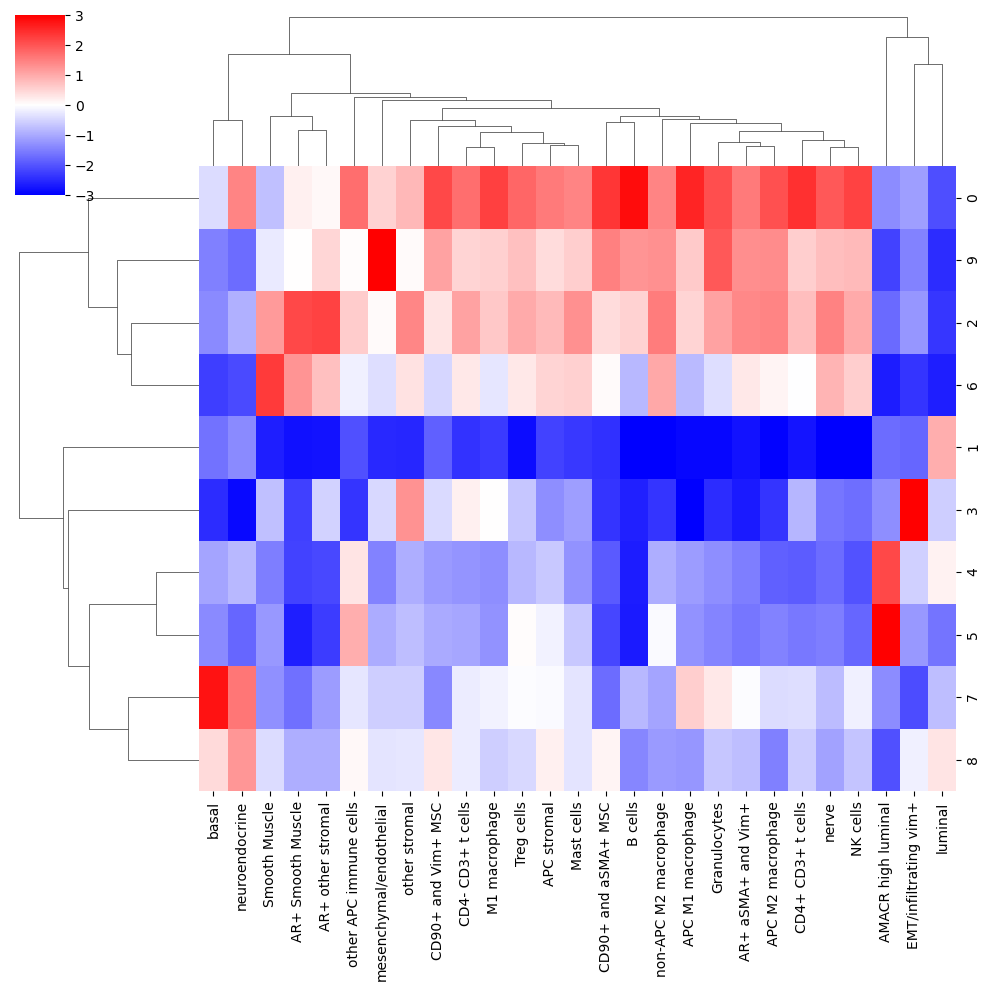

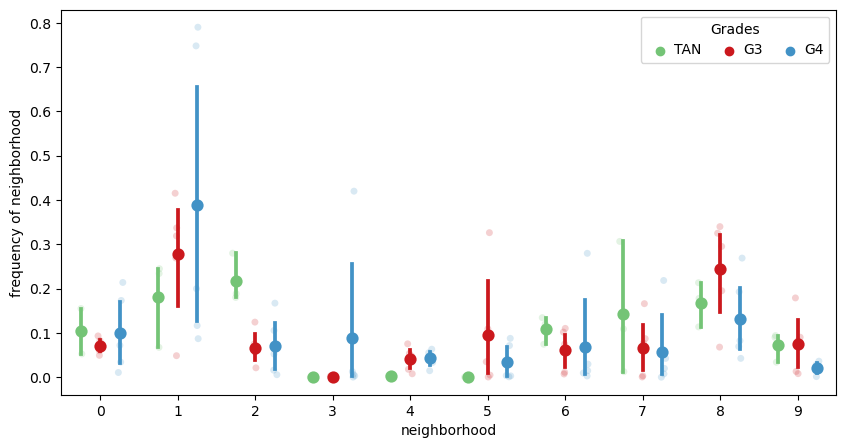

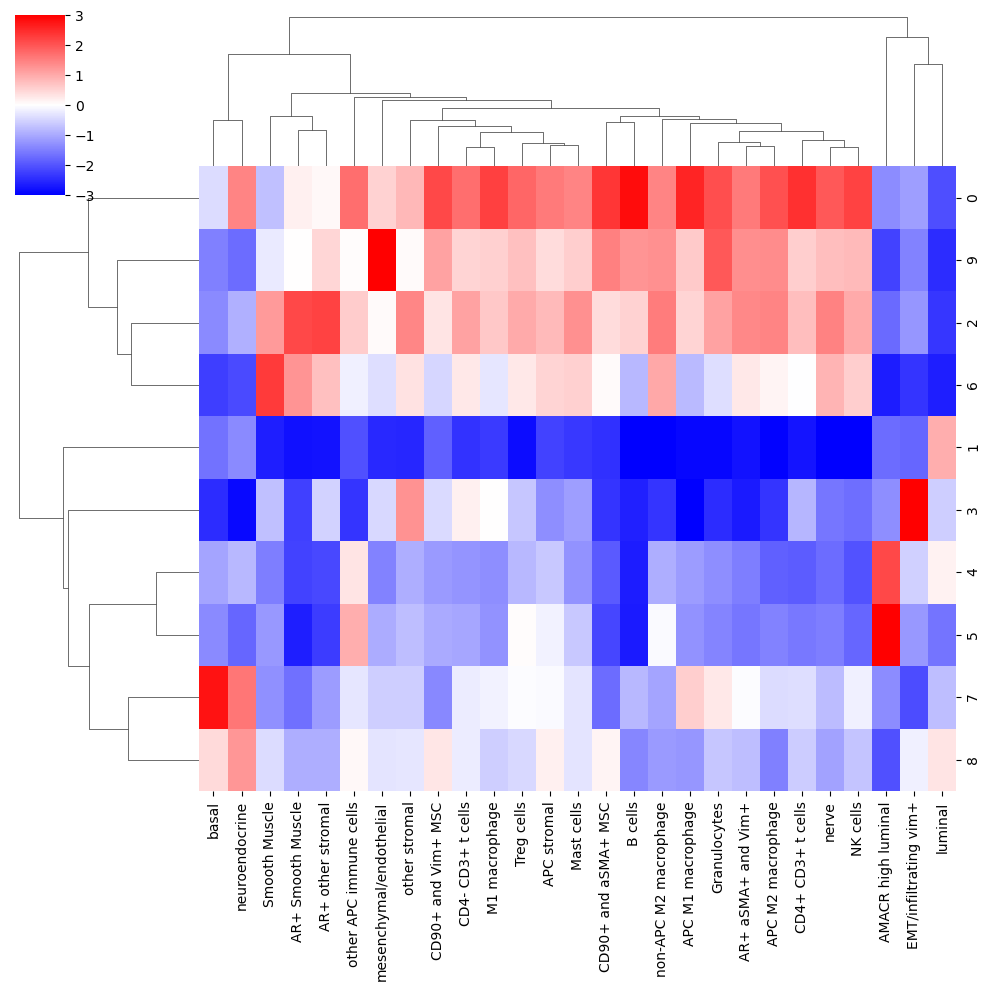

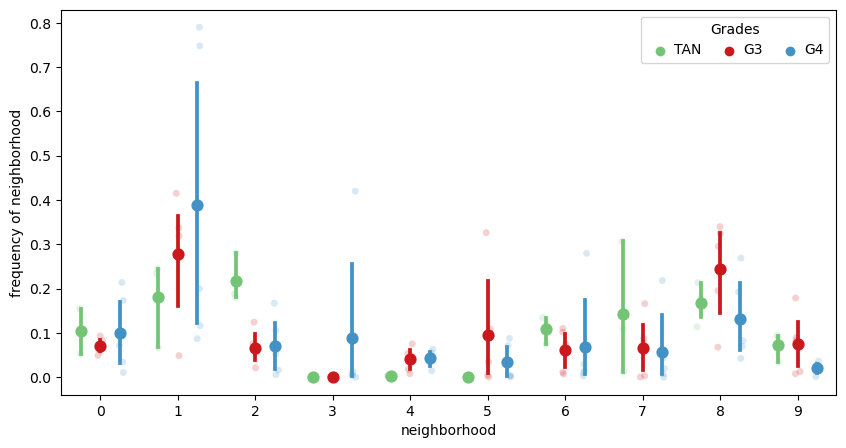

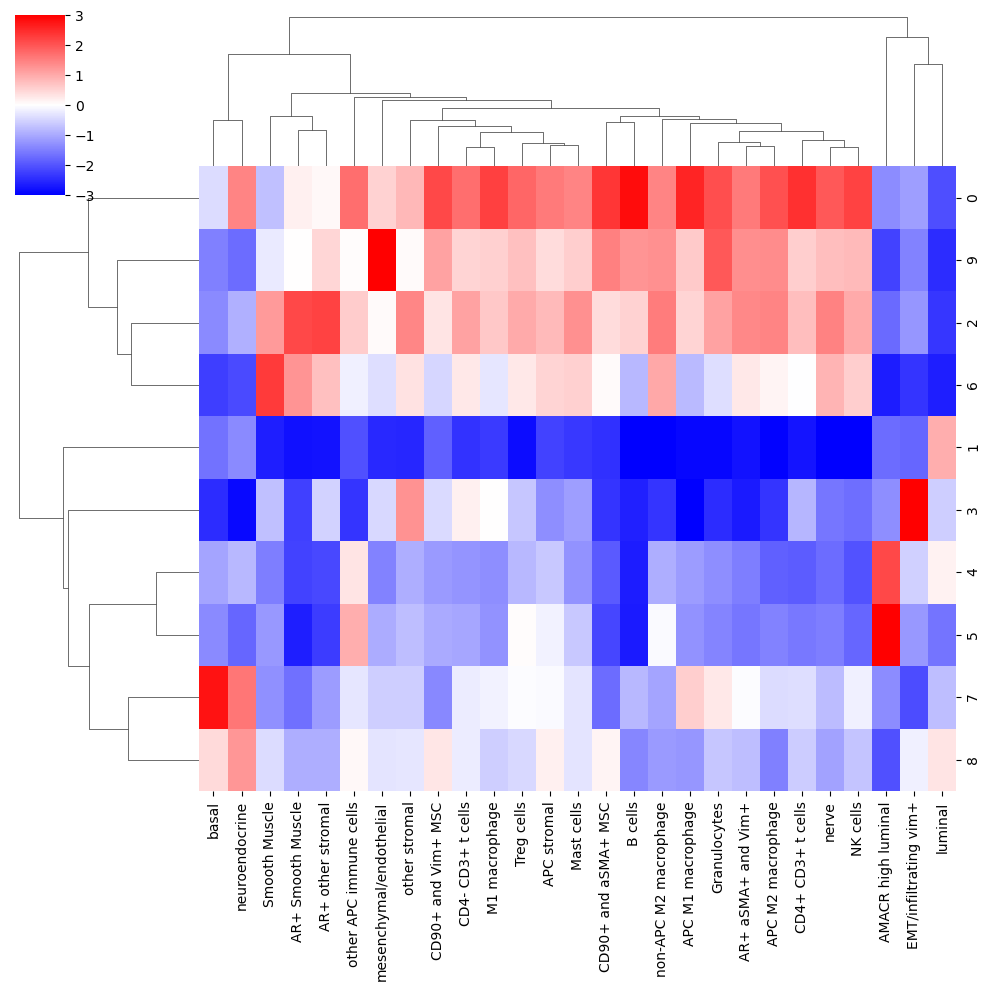

...

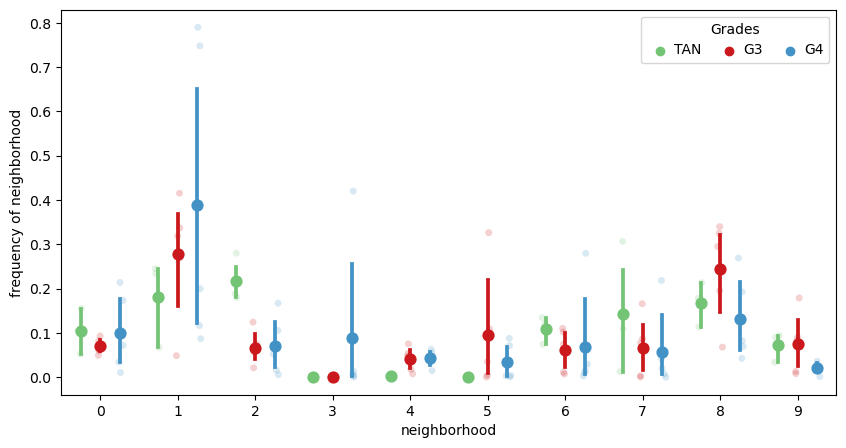

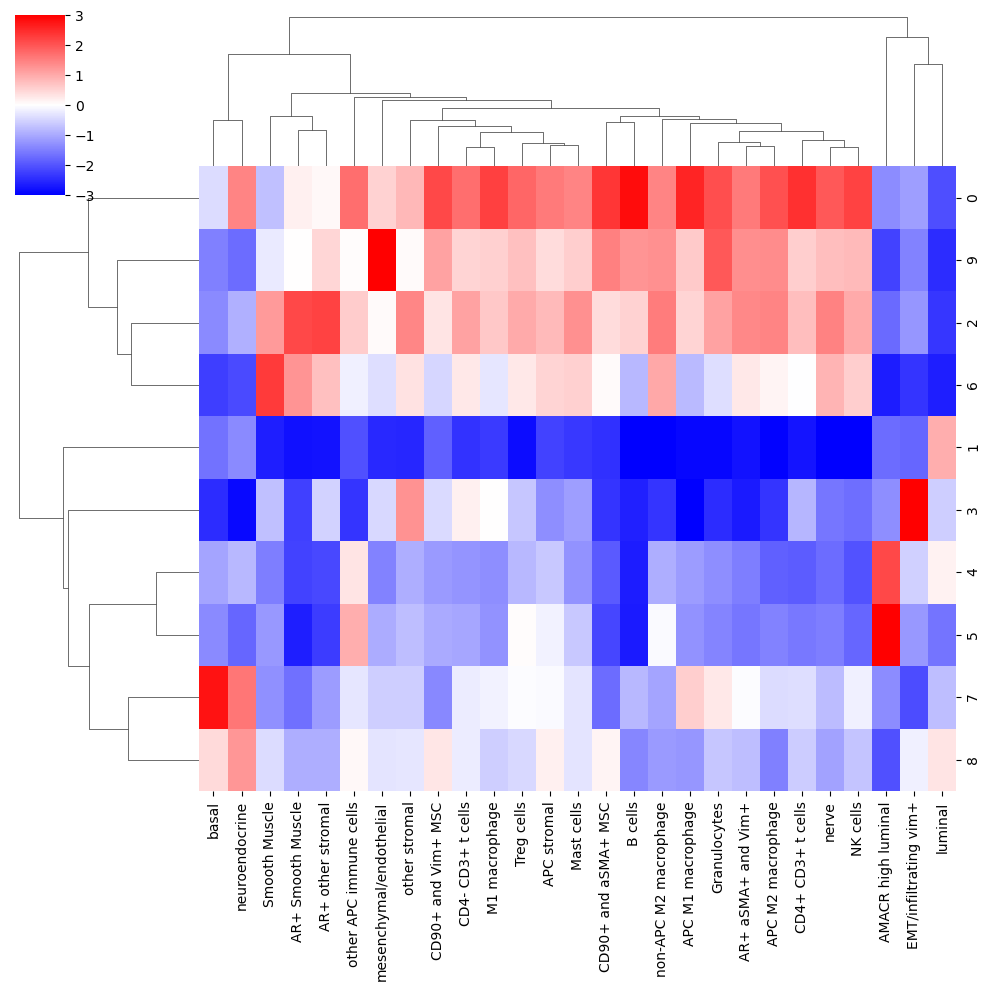

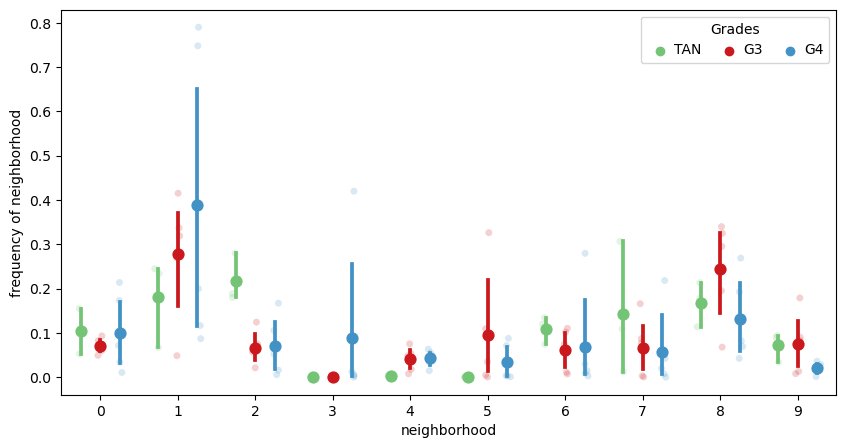

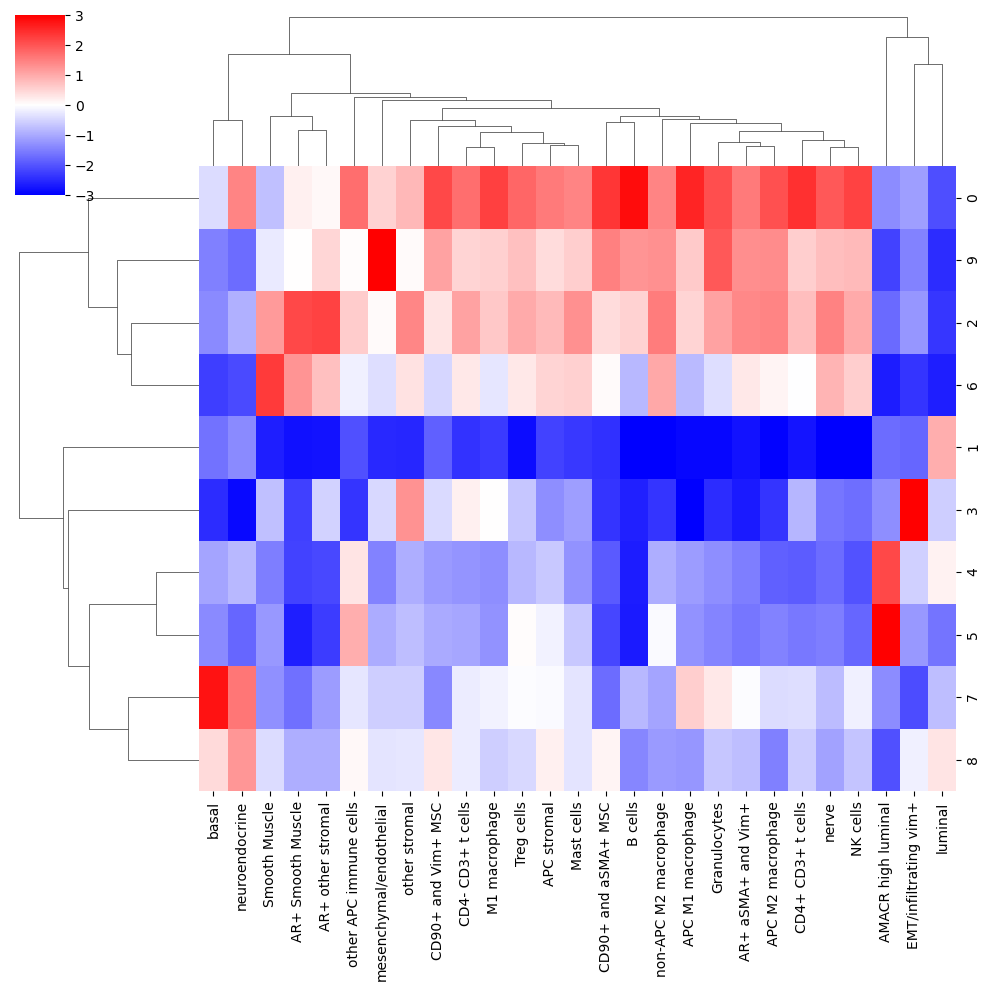

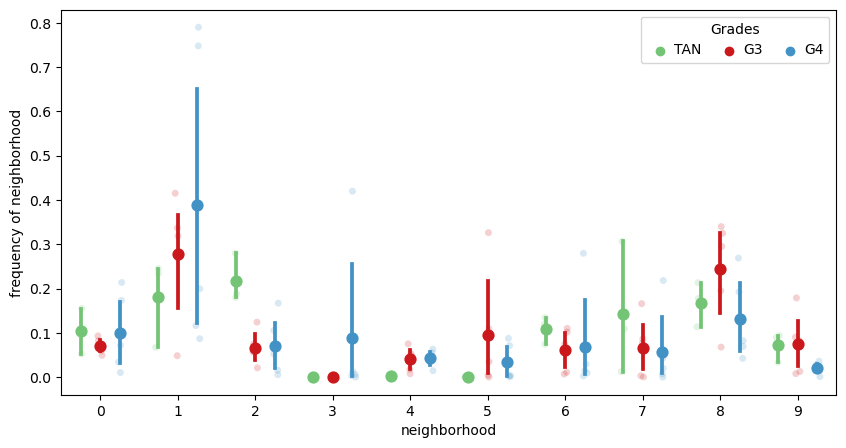

In [4]:
import random

for replication in range(100):
    
    random.seed(replication)
    ############
    #read in data and do some quick data rearrangement
    if file_type == 'pickle':
        cells = pd.read_pickle(path_to_data)
    if file_type == 'csv':
    #CA read data to be combined
        cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
        cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
        cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    
    #CA combine all data read with the next to line
    cells_3groups = [cells1, cells2, cells3]
    cells_all = pd.concat(cells_3groups)

    cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

    cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

    sum_cols = cells[cluster_col].unique()
    values = cells[sum_cols].values
    #############
    #find windows for each cell in each tissue region
    tissue_group = cells[[X,Y,reg]].groupby(reg)
    exps = list(cells[reg].unique())
    tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
    tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]
    #for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
    out_dict = {}
    for k in ks:
        for neighbors,job in zip(tissues,tissue_chunks):

            chunk = np.arange(len(neighbors))#indices
            tissue_name = job[2]
            indices = job[3]
            window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
            out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

    #concatenate the summed windows and combine into one dataframe for each window size tested.
    windows = {}
    for k in ks:
   
        window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
        window = window.loc[cells.index.values]
        window = pd.concat([cells[keep_cols],window],1)
        windows[k] = window
    k = 10
    n_neighborhoods = 10
    neighborhood_name = "neighborhood"+str(k)
    k_centroids = {}
    windows2 = windows[10]
    # windows2[cluster_col] = cells[cluster_col]

    km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

    labelskm = km.fit_predict(windows2[sum_cols].values)
    k_centroids[k] = km.cluster_centers_
    cells['neighborhood10'] = labelskm
    cells[neighborhood_name] = cells[neighborhood_name].astype('category')
    #['reg064_A','reg066_A','reg018_B','reg023_A']
    # this plot shows the types of cells (ClusterIDs) in the different niches 
    k_to_plot = 10
    niche_clusters = (k_centroids[k_to_plot])
    tissue_avgs = values.mean(axis = 0)
    fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
    fc = pd.DataFrame(fc,columns = sum_cols)
    #s=sns.clustermap(fc.loc[[0,2,3,4,5,6,7,8,9],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
    s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9],], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
    s.savefig("permutation/celltypes_perniche_10_replication{}.pdf".format(replication))
    ar_cn=np.unique(np.concatenate((np.where(fc['AR+ aSMA+ and Vim+'] > 0),
               np.where(fc['AR+ Smooth Muscle'] > 0), 
               np.where(fc['AR+ other stromal'] > 0)), axis = None))
    #plot for each group and each patient the percent of total cells allocated to each neighborhood
    fc = cells.groupby(['patients','groups']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

    fc.columns = range(10)
    melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
    melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
    f,ax = plt.subplots(figsize = (10,5))
    sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])
    sns.pointplot(data = melt, hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:3], ['TAN', 'G3', 'G4'], title="Grades", #CA changed labels[:3] to ['TAN', 'G3', 'G4']
          handletextpad=0, columnspacing=1,
          loc="upper right", ncol=3, frameon=True)
    plt.savefig('permutation/neighborhood_comparison_by_grade_replication{}.pdf'.format(replication))
    
    from scipy.stats import ttest_ind
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G3
    ttest_tan_g3 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g3.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==3]['frequency of neighborhood']))
    ttest_tan_g3 = pd.DataFrame(ttest_tan_g3)
    ttest_tan_g3.to_csv('permutation/random/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    ttest_tan_g3 = ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g3.to_csv('permutation/ar/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G4
    ttest_tan_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g4.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_tan_g4 = pd.DataFrame(ttest_tan_g4)
    ttest_tan_g4.to_csv('permutation/random/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    ttest_tan_g3= ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g4.to_csv('permutation/ar/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group G3 vs G4
    ttest_g3_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_g3_g4.append(ttest_ind(n2[n2['groups']==3]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_g3_g4 = pd.DataFrame(ttest_g3_g4)
    ttest_g3_g4.to_csv('permutation/random/ttest_g3_g4_replication{}.csv'.format(replication), index=False)
    ttest_g3_g4 = ttest_g3_g4.loc[ar_cn,:]
    ttest_g3_g4.to_csv('permutation/ar/ttest_g3_g4_replication{}.csv'.format(replication), index=False)